In [1]:
import os, sys
import re
import time
from collections import Counter

import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.patches as patches

import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.data.dataset import Dataset
from torch.utils.data import DataLoader

import pandas as pd
import cv2
from tqdm import tqdm

In [162]:
# Install a pip package in the current Jupyter kernel
import sys
!{sys.executable} -m pip install --user bbox

You should consider upgrading via the 'pip install --upgrade pip' command.


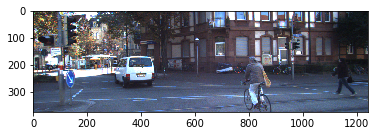

In [2]:
img_dir = "/projectnb/cs591dl/shawnlin/object-tracking/dataset/data_tracking_image_2/training/image_02/0000/"
# img = mpimg.imread(img_dir + "000000.png")
img = cv2.imread(img_dir + "000000.png", cv2.IMREAD_COLOR)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.show()

In [3]:
# Load label txt for video
HEADER = [
    "frame",
    "track_id",
    "type",
    "truncated",
    "occluded",
    "alpha",
    "bbox_l",
    "bbox_t",
    "bbox_r",
    "bbox_b",
    "dim_h",
    "dim_w",
    "dim_l",
    "loc_x",
    "loc_y",
    "loc_z",
    "rot_y",
    "score"
]

lab_dir = "/projectnb/cs591dl/shawnlin/object-tracking/dataset/data_tracking_label_2/training/label_02/"
label = pd.read_csv(lab_dir + "0000.txt",  sep=" ", names=HEADER)
label

,frame,track_id,type,truncated,occluded,alpha,bbox_l,bbox_t,bbox_r,bbox_b,dim_h,dim_w,dim_l,loc_x,loc_y,loc_z,rot_y,score
0,0,-1,DontCare,-1,-1,-10.000000,219.310000,188.490000,245.500000,218.560000,-1000.000000,-1000.000000,-1000.000000,-10.000000,-1.000000,-1.000000,-1.000000,NaN
1,0,-1,DontCare,-1,-1,-10.000000,47.560000,195.280000,115.480000,221.480000,-1000.000000,-1000.000000,-1000.000000,-10.000000,-1.000000,-1.000000,-1.000000,NaN
2,0,0,Van,0,0,-1.793451,296.744956,161.752147,455.226042,292.372804,2.000000,1.823255,4.433886,-4.552284,1.858523,13.410495,-2.115488,NaN
3,0,1,Cyclist,0,0,-1.936993,737.619499,161.531951,931.112229,374.000000,1.739063,0.824591,1.785241,1.640400,1.675660,5.776261,-1.675458,NaN
4,0,2,Pedestrian,0,0,-2.523309,1106.137292,166.576807,1204.470628,323.876144,1.714062,0.767881,0.972283,6.301919,1.652419,8.455685,-1.900245,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1084,153,10,Car,0,2,-1.818856,680.294919,177.511028,842.313244,284.070033,1.524000,1.728591,3.894227,2.353367,1.622590,12.436503,-1.637280,NaN
1085,153,11,Car,0,2,1.864481,245.920800,194.456182,394.817829,286.444967,1.444000,1.595116,3.791789,-5.458963,1.908188,13.979427,1.497916,NaN
1086,153,12,Pedestrian,1,0,0.826456,1185.199080,151.165841,1241.000000,348.552707,1.688000,0.800000,0.884000,5.739732,1.500532,6.279632,1.543272,NaN
1087,153,13,Car,0,0,1.773993,344.361560,188.772369,430.531955,248.482384,1.422414,1.512803,3.707634,-6.033258,1.888008,19.788795,1.481180,NaN


In [4]:
# Get label at frame 0
label[label["frame"] == 0]

,frame,track_id,type,truncated,occluded,alpha,bbox_l,bbox_t,bbox_r,bbox_b,dim_h,dim_w,dim_l,loc_x,loc_y,loc_z,rot_y,score
0,0,-1,DontCare,-1,-1,-10.000000,219.310000,188.490000,245.500000,218.560000,-1000.000000,-1000.000000,-1000.000000,-10.000000,-1.000000,-1.000000,-1.000000,NaN
1,0,-1,DontCare,-1,-1,-10.000000,47.560000,195.280000,115.480000,221.480000,-1000.000000,-1000.000000,-1000.000000,-10.000000,-1.000000,-1.000000,-1.000000,NaN
2,0,0,Van,0,0,-1.793451,296.744956,161.752147,455.226042,292.372804,2.000000,1.823255,4.433886,-4.552284,1.858523,13.410495,-2.115488,NaN
3,0,1,Cyclist,0,0,-1.936993,737.619499,161.531951,931.112229,374.000000,1.739063,0.824591,1.785241,1.640400,1.675660,5.776261,-1.675458,NaN
4,0,2,Pedestrian,0,0,-2.523309,1106.137292,166.576807,1204.470628,323.876144,1.714062,0.767881,0.972283,6.301919,1.652419,8.455685,-1.900245,NaN


In [5]:
# Traverse training set and label

train_dir = "/projectnb/cs591dl/shawnlin/object-tracking/dataset/data_tracking_image_2/training/image_02/"
train_label_dir = "/projectnb/cs591dl/shawnlin/object-tracking/dataset/data_tracking_label_2/training/label_02/"

# image_class_info = {}
image_class_info = pd.DataFrame(columns=["video_id", "frame_id", "class", "image_path"])

for dirname in sorted(os.listdir(train_dir)):
    tot_frame = 0
    # Get corresponding train labels
    label = pd.read_csv(train_label_dir + dirname + ".txt", sep=" ", names=HEADER)
    # Traverse image dir
    for filename in sorted(os.listdir(train_dir + dirname)):
        tot_frame += 1
        image_path = train_dir + dirname + "/" + filename

        # parse frame id from filename
        cur_frame_id = int(re.sub(r"\.png", "", filename))
        
        # select label rows with corresponding frame id
        cur_label = label[label["frame"] == cur_frame_id]
        types = list(cur_label["type"])
        
        pedestrian_labels = cur_label[cur_label["type"] == "Pedestrian"]
        bbox_l = ",".join([str(v) for v in pedestrian_labels["bbox_l"].tolist()])
        bbox_t = ",".join([str(v) for v in pedestrian_labels["bbox_t"].tolist()])
        bbox_r = ",".join([str(v) for v in pedestrian_labels["bbox_r"].tolist()])
        bbox_b = ",".join([str(v) for v in pedestrian_labels["bbox_b"].tolist()])
        
        new_row = {"video_id": dirname,
                   "frame_id": cur_frame_id,
                   "class": 0,
                   "image_path": image_path,
                   "bbox_l": bbox_l,
                   "bbox_t": bbox_t,
                   "bbox_r": bbox_r,
                   "bbox_b": bbox_b}
        
        # detect class-0 / class-1(w/t pedestrian)
        if "Pedestrian" in types:
            new_row["class"] = 1
        
        image_class_info = image_class_info.append(new_row, ignore_index=True)
        
        # print("  %s => types: [%s]" % (filename, ", ".join(types)))
    print("Total frames for video %s: %i" % (dirname, tot_frame))
    

Total frames for video 0000: 154
Total frames for video 0001: 447
Total frames for video 0002: 233
Total frames for video 0003: 144
Total frames for video 0004: 314
Total frames for video 0005: 297
Total frames for video 0006: 270
Total frames for video 0007: 800
Total frames for video 0008: 390
Total frames for video 0009: 803
Total frames for video 0010: 294
Total frames for video 0011: 373
Total frames for video 0012: 78
Total frames for video 0013: 340
Total frames for video 0014: 106
Total frames for video 0015: 376
Total frames for video 0016: 209
Total frames for video 0017: 145
Total frames for video 0018: 339
Total frames for video 0019: 1059
Total frames for video 0020: 837


In [6]:
# Class 1 & class 0 count
counts = image_class_info.groupby(["class"]).size()
ratio = counts[1]/counts[0]
print(counts, ratio)

class
0    5479
1    2529
dtype: int64 0.4615805803978828


In [7]:
# Balance class 0 and 1
a = image_class_info[image_class_info["class"] == 0].sample(frac=ratio)
b = image_class_info[image_class_info["class"] == 1].sample(frac=1)
balanced_image_class_info = a.append(b)
balanced_image_class_info

,video_id,frame_id,class,image_path,bbox_b,bbox_l,bbox_r,bbox_t
6001,0018,228,0,/projectnb/cs591dl/shawnlin/object-tracking/da...,,,,
3096,0009,47,0,/projectnb/cs591dl/shawnlin/object-tracking/da...,,,,
2263,0007,404,0,/projectnb/cs591dl/shawnlin/object-tracking/da...,,,,
2389,0007,530,0,/projectnb/cs591dl/shawnlin/object-tracking/da...,,,,
355,0001,201,0,/projectnb/cs591dl/shawnlin/object-tracking/da...,,,,
...,...,...,...,...,...,...,...,...
797,0002,196,1,/projectnb/cs591dl/shawnlin/object-tracking/da...,272.698214,297.15472400000004,335.821391,171.659478
6502,0019,390,1,/projectnb/cs591dl/shawnlin/object-tracking/da...,"373.0,373.0,228.60755,215.339992,214.978812,21...","161.268934,87.95660699999999,646.045813,494.79...","251.26892999999998,170.623275,677.379148000000...","161.331881,168.909547,154.664782,167.782392,16..."
4864,0013,267,1,/projectnb/cs591dl/shawnlin/object-tracking/da...,"283.607552,374.0,374.0,321.30745099999996,317....","389.733947,0.0,26.809516,911.4167279999999,973...","433.533607,148.72815,162.129368,984.230434,106...","177.42274799999998,156.155811,158.590388,142.6..."
5088,0015,45,1,/projectnb/cs591dl/shawnlin/object-tracking/da...,"203.383029,208.151912,209.520961","516.002485,423.395993,408.239778","531.806259,444.17937699999993,425.15460099999996","160.32021899999998,161.75501699999998,165.450471"


In [55]:
# Get the average size of the image
accum_shape = None
for path in tqdm(balanced_image_class_info["image_path"].tolist()[:]):
    img = mpimg.imread(path)
    if accum_shape is None:
        accum_shape = np.array(img.shape)
    else:
        accum_shape += np.array(img.shape)
accum_shape = accum_shape / len(balanced_image_class_info["image_path"].tolist())
accum_shape


  3%|▎         | 142/5058 [00:05<03:50, 21.37it/s]

KeyboardInterrupt: 

In [40]:
# Get the average size of the image
accum_shape = None
for path in tqdm(balanced_image_class_info["image_path"].tolist()[:]):
    img = cv2.imread(path, cv2.IMREAD_COLOR)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    if accum_shape is None:
        accum_shape = np.array(img.shape)
    else:
        accum_shape += np.array(img.shape)
accum_shape = accum_shape / len(balanced_image_class_info["image_path"].tolist())
accum_shape

100%|██████████| 5058/5058 [01:26<00:00, 58.63it/s]


array([ 374.09667853, 1238.31455121,    3.        ])

In [8]:
# Split into Train/Val/Test
# TODO: Cross validation?

shuffled_image_class_info = balanced_image_class_info.sample(frac = 1.0)

TRAIN_SIZE = int(len(shuffled_image_class_info) * 0.7)
VAL_SIZE = int(len(shuffled_image_class_info) * 0.1)
TEST_SIZE = int(len(shuffled_image_class_info) * 0.2)


train_img_class_info = shuffled_image_class_info[:TRAIN_SIZE]
val_img_class_info = shuffled_image_class_info[TRAIN_SIZE:TRAIN_SIZE+VAL_SIZE]
test_img_class_info = shuffled_image_class_info[TRAIN_SIZE+VAL_SIZE:]

print("Train size: %s" % len(train_img_class_info))
print("Val size: %s" % len(val_img_class_info))
print("Test size: %s" % len(test_img_class_info))


Train size: 3540
Val size: 505
Test size: 1013


In [19]:
def get_iou(bb1, bb2):
    """
    Calculate the Intersection over Union (IoU) of two bounding boxes.

    Parameters
    ----------
    bb1 : dict
        Keys: {'x1', 'x2', 'y1', 'y2'}
        The (x1, y1) position is at the top left corner,
        the (x2, y2) position is at the bottom right corner
    bb2 : dict
        Keys: {'x1', 'x2', 'y1', 'y2'}
        The (x, y) position is at the top left corner,
        the (x2, y2) position is at the bottom right corner

    Returns
    -------
    float
        in [0, 1]
    """
#     assert bb1['x1'] < bb1['x2']
#     assert bb1['y1'] < bb1['y2']
#     assert bb2['x1'] < bb2['x2']
#     assert bb2['y1'] < bb2['y2']

    # determine the coordinates of the intersection rectangle
    x_left = max(bb1['x1'], bb2['x1'])
    y_top = max(bb1['y1'], bb2['y1'])
    x_right = min(bb1['x2'], bb2['x2'])
    y_bottom = min(bb1['y2'], bb2['y2'])

    if x_right < x_left or y_bottom < y_top:
        return 0.0

    # The intersection of two axis-aligned bounding boxes is always an
    # axis-aligned bounding box
    intersection_area = (x_right - x_left) * (y_bottom - y_top)

    # compute the area of both AABBs
    bb1_area = (bb1['x2'] - bb1['x1']) * (bb1['y2'] - bb1['y1'])
    bb2_area = (bb2['x2'] - bb2['x1']) * (bb2['y2'] - bb2['y1'])

    # compute the intersection over union by taking the intersection
    # area and dividing it by the sum of prediction + ground-truth
    # areas - the interesection area
    #iou = intersection_area / float(bb1_area + bb2_area - intersection_area)
    #assert iou >= 0.0
    #assert iou <= 1.0
    if float(bb2_area) == 0.0:
        return 0.0
    return float(intersection_area)/float(bb2_area)

a1 = {"x1": 400, "x2": 624, "y1": 0, "y2": 224}
a2 = {"x1": 230, "x2": 261, "y1": 169, "y2": 255} #514 573 88 195 #230 261 169 255
get_iou(a1, a2)

# from bbox import BBox2D, XYXY
# from bbox.metrics import jaccard_index_2d

# a1 = BBox2D([400, 0, 624, 224], mode=XYXY)
# a2 = BBox2D([230, 169, 230, 255], mode=XYXY)
# jaccard_index_2d(a1, a2)

0.0

0it [00:00, ?it/s]

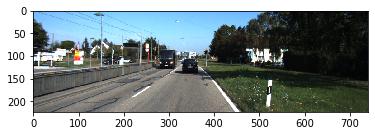

False


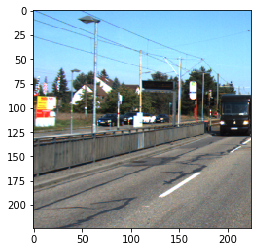

1it [00:00,  2.57it/s]

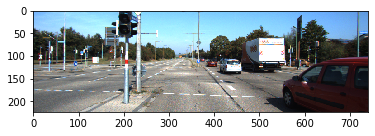

False


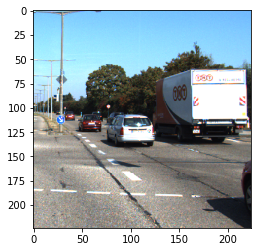

2it [00:00,  2.59it/s]

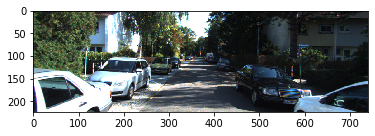

False


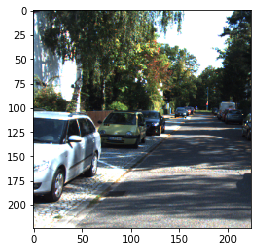

3it [00:01,  2.61it/s]

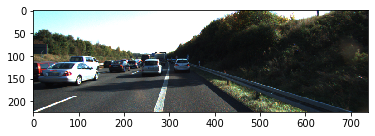

False


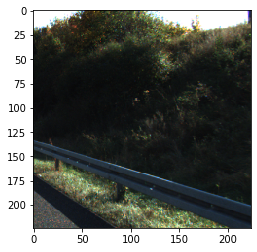

4it [00:01,  2.50it/s]

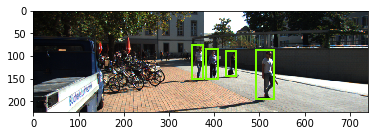

False


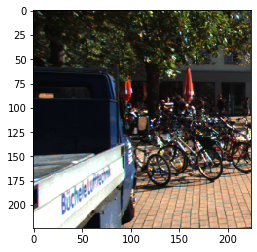

5it [00:01,  2.52it/s]

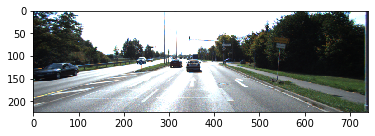

False


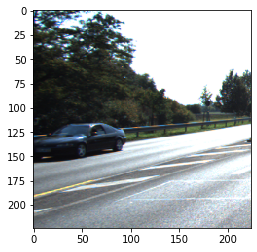

6it [00:02,  2.55it/s]

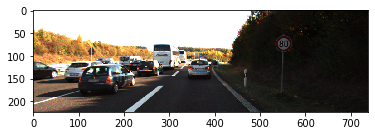

False


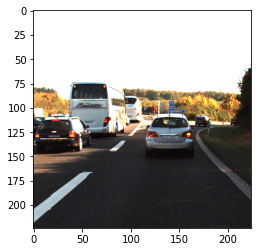

6it [00:02,  2.20it/s]


In [10]:
# for i, (index, row) in tqdm(enumerate(balanced_image_class_info[balanced_image_class_info["class"] == 1].iterrows())):
for i, (index, row) in tqdm(enumerate(train_img_class_info.iterrows())):
    img = cv2.imread(row["image_path"], cv2.IMREAD_COLOR)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    img_resize = cv2.resize(img, (int(img.shape[1]*224/img.shape[0]), 224))
    plt.imshow(img_resize)    
    # mask = np.zeros((img_resize.shape[0], img_resize.shape[1]))
    
    # Cropping and detecting bounding box IoU
    crop_idx = np.random.randint(0, img_resize.shape[1]-224)
    img_crop = img_resize[:, crop_idx:crop_idx+224]
    has_full_pedestrian = False

    # Using bounding box info
    if row["bbox_l"] != "":
        ax = plt.gca()
        for tup in zip(row["bbox_l"].split(","), row["bbox_t"].split(","), row["bbox_r"].split(","), row["bbox_b"].split(",")):
            bbox_l = int(float(tup[0])*740/1240)
            bbox_t = int(float(tup[1])*224/375)
            bbox_r = int(float(tup[2])*740/1240)
            bbox_b = int(float(tup[3])*224/375)

            # mask[bbox_t: bbox_b, bbox_l:bbox_r] = 1.0

            # Calculate IoU?
            crop_box = {"x1": crop_idx, "x2": crop_idx+224, "y1": 0, "y2": 224}
            obj_box = {"x1": bbox_l, "x2": bbox_r, "y1": bbox_t, "y2": bbox_b}
            coverage = get_iou(crop_box, obj_box)
            if coverage > 0.79:
                has_full_pedestrian = True
            rect = patches.Rectangle((bbox_l, bbox_t), (bbox_r - bbox_l), (bbox_b - bbox_t), linewidth=2, edgecolor='lawngreen', facecolor='none', label="%.2f"%coverage)
            ax.add_patch(rect)
    plt.show()
    
    plt.imshow(img_crop)
    print(has_full_pedestrian)
    plt.show()
    
    if i > 5: break

In [11]:
# Define model

model = torchvision.models.resnet18(pretrained=True)
for param in model.parameters():
    param.requires_grad = False

# Parameters of newly constructed modules have requires_grad=True by default
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 1)
model = model.cuda()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([224, 224, 3])


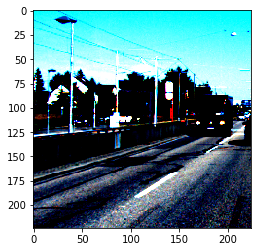

0.0
torch.Size([224, 224, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


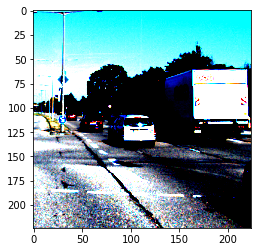

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0
<class 'torch.Tensor'>
torch.Size([224, 224, 3])


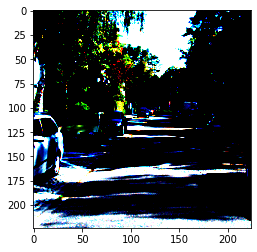

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0
torch.Size([224, 224, 3])


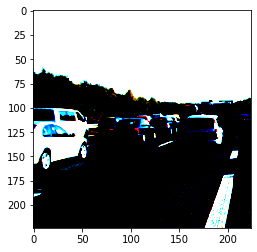

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0
<class 'torch.Tensor'>
torch.Size([224, 224, 3])


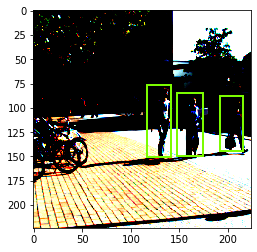

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0
torch.Size([224, 224, 3])


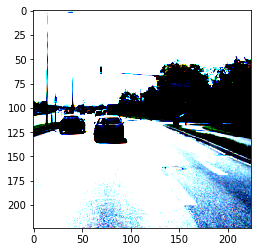

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0
<class 'torch.Tensor'>
torch.Size([224, 224, 3])


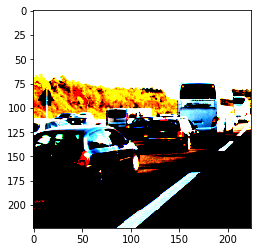

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0
torch.Size([224, 224, 3])


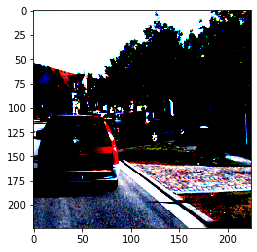

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0
<class 'torch.Tensor'>
torch.Size([224, 224, 3])


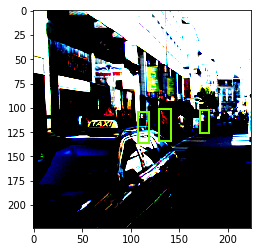

1.0
torch.Size([224, 224, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


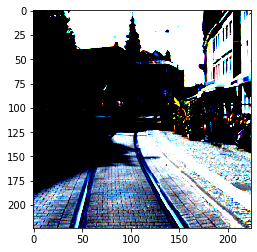

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0
<class 'torch.Tensor'>
torch.Size([224, 224, 3])


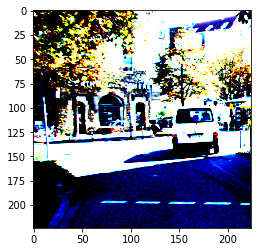

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0
torch.Size([224, 224, 3])


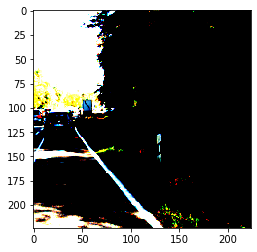

0.0
<class 'torch.Tensor'>


In [21]:
# Dataset wrapper

def collate_fn(seq_list):
    img, target = zip(*seq_list)
    #print("collate", target, len(target))
    #imgT = torch.stack([i for i in img])
    targets = [t for t in target]
    imgT = torch.stack([i for i in img])
#     imgT = [i for i in img]
#     imgT = torch.LongTensor(imgT)
    #print("collate_after", targets)
    return (imgT, targets)

class KittiDataset(Dataset):
    def __init__(self, image_class_info):
        # TODO: maybe put the whole preprocess thing here?
        self.img_class_info = image_class_info
        self.transform = transforms.Compose([transforms.ToTensor(),
                                             transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                                                  std=[0.229, 0.224, 0.225])])

        
    def __getitem__(self, index):
        row = self.img_class_info.iloc[index]
        img = cv2.imread(row["image_path"], cv2.IMREAD_COLOR)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img_resize = cv2.resize(img, (740, 224))

        # Cropping to 224x224 considering bounding box labels
        crop_idx = np.random.randint(0, img_resize.shape[1]-224)
        img_crop = img_resize[:, crop_idx:crop_idx+224]

        target = {}
        label = 0.0
        bboxs = []
        
        # Using bounding box info 
        if row["bbox_l"] != "":
            for tup in zip(row["bbox_l"].split(","), row["bbox_t"].split(","), row["bbox_r"].split(","), row["bbox_b"].split(",")):
                bbox_l = int(float(tup[0])*740/1240)
                bbox_t = int(float(tup[1])*224/375)
                bbox_r = int(float(tup[2])*740/1240)
                bbox_b = int(float(tup[3])*224/375)

                # Calculate IoU?
                crop_box = {"x1": crop_idx, "x2": crop_idx+224, "y1": 0, "y2": 224}
                obj_box = {"x1": bbox_l, "x2": bbox_r, "y1": bbox_t, "y2": bbox_b}
                # Positive tile if any of the pedestrian bounding box has a coverage of over 80%
                coverage = get_iou(crop_box, obj_box)

                bboxs.append([bbox_l-crop_idx, bbox_r-crop_idx, bbox_t, bbox_b]) # need to subtract crop_idx for x coord so that the box can fit.
                if coverage > 0.5:
                    label = 1.0

        target["label"] = label
        target["bboxs"] = bboxs

        imgT = self.transform(img_crop)
        #print(imgT.shape, img_crop.shape)
        return (imgT, target)

    def __len__(self):
        return len(self.img_class_info)

tr_dataset = KittiDataset(train_img_class_info)
tst_dataset = KittiDataset(test_img_class_info)
val_dataset = KittiDataset(val_img_class_info)

tr_loader = DataLoader(tr_dataset, batch_size=2, shuffle=False, num_workers=1, collate_fn=collate_fn)

for batch_id, (imgT, targetT) in enumerate(tr_loader):
    if batch_id > 5: break
    
    # For debug visualization
    for img, target in zip(imgT, targetT):
        raw_img = img.permute(1, 2, 0)
        print(raw_img.shape)
        plt.imshow(raw_img)
        ax = plt.gca()
        for bbox in target["bboxs"]:
            bbox_l, bbox_r, bbox_t, bbox_b = bbox
            rect = patches.Rectangle((bbox_l, bbox_t), (bbox_r - bbox_l), (bbox_b - bbox_t), linewidth=2, edgecolor='lawngreen', facecolor='none')
            ax.add_patch(rect)
        plt.show()
        print(target["label"])
    print(type(imgT))


In [22]:
import time
import copy

device = torch.device("cuda")
model
dataloaders = {
    "train": DataLoader(tr_dataset, batch_size=16, shuffle=False, num_workers=1, collate_fn=collate_fn),
    "val": DataLoader(val_dataset, batch_size=16, shuffle=False, num_workers=1, collate_fn=collate_fn),
    "test": DataLoader(tst_dataset, batch_size=2, shuffle=False, num_workers=1, collate_fn=collate_fn)
}
dataset_sizes = {
    "train": 3540.,
    "val": 505.,
    "test": 1013.
}

print("train", len(dataloaders["train"]))
print("val", len(dataloaders["val"]))

def train_model(model, criterion, optimizer, scheduler, dataloaders, num_epochs=5):
    
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0


    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            # for inputs, labels in dataloaders[phase]:
            for batch_id, (imgT, targetT) in enumerate(dataloaders[phase]):
                inputs = imgT.to(device)
                labels = torch.FloatTensor([t["label"] for t in targetT])[:, None].to(device)
                # print("labels", labels.shape)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    preds = (outputs > 0.).float()
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

train 222
val 32


In [23]:
criterion = nn.BCEWithLogitsLoss()
# Observe that all parameters are being optimized
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

best_model = train_model(model, criterion, optimizer, exp_lr_scheduler, dataloaders)

Epoch 0/4
----------
train Loss: 0.3426 Acc: 0.8537
val Loss: 0.2876 Acc: 0.8911

Epoch 1/4
----------
train Loss: 0.3244 Acc: 0.8630
val Loss: 0.2757 Acc: 0.8950

Epoch 2/4
----------
train Loss: 0.3106 Acc: 0.8698
val Loss: 0.2692 Acc: 0.8931

Epoch 3/4
----------
train Loss: 0.3008 Acc: 0.8743
val Loss: 0.2651 Acc: 0.8931

Epoch 4/4
----------
train Loss: 0.2933 Acc: 0.8760
val Loss: 0.2622 Acc: 0.8911

Training complete in 4m 34s
Best val Acc: 0.895050


In [24]:
def test_model(model, criterions, dataloaders):
    
    # Each epoch has a training and validation phase
    model.eval()   # Set model to evaluate mode

    running_loss = 0.0
    running_corrects = 0

    # Iterate over data.
    for batch_id, (imgT, targetT) in enumerate(dataloaders["test"]):
        inputs = imgT.to(device)
        labels = torch.FloatTensor([t["label"] for t in targetT])[:, None].to(device)

        # forward
        # track history if only in train
        with torch.set_grad_enabled(False):
            outputs = model(inputs)
            preds = (outputs > 0.).float()
            loss = criterion(outputs, labels)

        # statistics
        running_loss += loss.item() * inputs.size(0)
        running_corrects += torch.sum(preds == labels.data)

        epoch_loss = running_loss / dataset_sizes["test"]
        epoch_acc = running_corrects.double() / dataset_sizes["test"]

    print('{} Loss: {:.4f} Acc: {:.4f}'.format("test", epoch_loss, epoch_acc))
    print()

test_model(best_model, criterion, dataloaders)

test Loss: 0.2903 Acc: 0.8766



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([224, 224, 3])


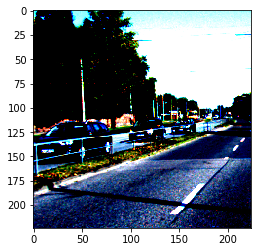

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[0.],
        [0.]], device='cuda:0')
torch.Size([224, 224, 3])


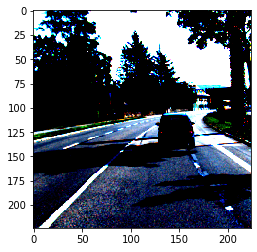

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[0.],
        [1.]], device='cuda:0')
torch.Size([224, 224, 3])


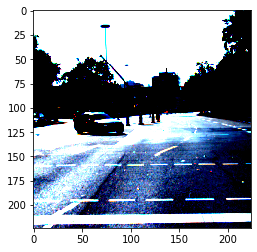

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[0.],
        [1.]], device='cuda:0')
torch.Size([224, 224, 3])


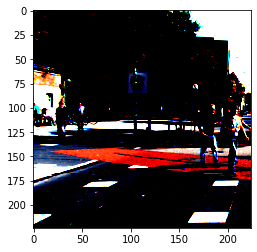

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[1.],
        [1.]], device='cuda:0')
torch.Size([224, 224, 3])


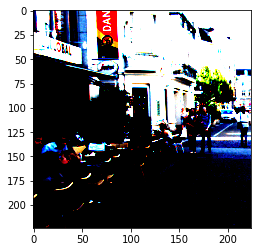

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[1.],
        [1.]], device='cuda:0')
torch.Size([224, 224, 3])


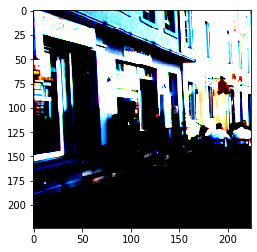

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[1.],
        [0.]], device='cuda:0')
torch.Size([224, 224, 3])


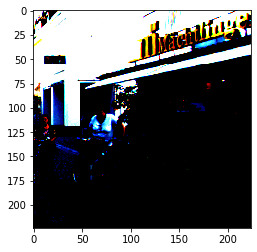

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[1.],
        [1.]], device='cuda:0')
torch.Size([224, 224, 3])


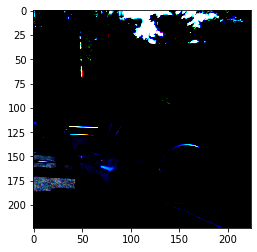

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[0.],
        [1.]], device='cuda:0')
torch.Size([224, 224, 3])


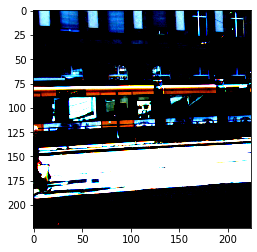

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[0.],
        [1.]], device='cuda:0')
torch.Size([224, 224, 3])


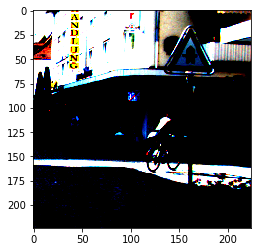

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


tensor([[1.],
        [0.]], device='cuda:0')
torch.Size([224, 224, 3])


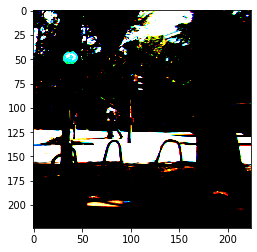

tensor([[1.],
        [1.]], device='cuda:0')


In [26]:
# TODO: Maybe visualize some of the classification results?

def vis_model(model, criterions, dataloaders):
    
    # Each epoch has a training and validation phase
    model.eval()   # Set model to evaluate mode

    running_loss = 0.0
    running_corrects = 0

    # Iterate over data.
    for batch_id, (imgT, targetT) in enumerate(dataloaders["test"]):
        if batch_id > 10: break

        inputs = imgT.to(device)
        labels = torch.FloatTensor([t["label"] for t in targetT])[:, None].to(device)

        
        raw_img = imgT[0].permute(1, 2, 0)
        print(raw_img.shape)
        plt.imshow(raw_img)
        ax = plt.gca()
        for bbox in target["bboxs"]:
            bbox_l, bbox_r, bbox_t, bbox_b = bbox
            rect = patches.Rectangle((bbox_l, bbox_t), (bbox_r - bbox_l), (bbox_b - bbox_t), linewidth=2, edgecolor='lawngreen', facecolor='none')
            ax.add_patch(rect)
        plt.show()
        
        # forward
        # track history if only in train
        with torch.set_grad_enabled(False):
            outputs = model(inputs)
            preds = (outputs > 0.).float()
            print(preds)


vis_model(best_model, criterion, dataloaders)

In [132]:
# Calculate average bounding box size
DEBUG = False

avg_box_height = []
avg_box_width = []
for index, row in tqdm(balanced_image_class_info[balanced_image_class_info["class"] == 1].iterrows()):

    # Load frame label
    label_file = "%s%s.txt" % (train_label_dir, row["video_id"])
    label = pd.read_csv(label_file, sep=" ", names=HEADER)
    label = label[(label["frame"] == row["frame_id"]) & (label["type"] == "Pedestrian")]

    # Read image from file
    if DEBUG:
        img = mpimg.imread(row["image_path"])
        plt.imshow(img)
        ax = plt.gca()

    # Draw bounding box for pedestrian
    for tup in label[["bbox_l", "bbox_t", "bbox_r", "bbox_b"]].to_numpy():
        avg_box_height.append(tup[3]-tup[1])
        avg_box_width.append(tup[2]-tup[0])
        if DEBUG:
            rect = patches.Rectangle((tup[0], tup[1]), (tup[2]-tup[0]), (tup[3]-tup[1]), linewidth=2, edgecolor='lawngreen', facecolor='none')
            ax.add_patch(rect)
        
    if DEBUG:
        plt.show()
#     break

print("height:", sum(avg_box_height)/len(avg_box_height))
print("width:", sum(avg_box_width)/len(avg_box_width))

2529it [00:33, 74.94it/s]

height: 115.27319254943286
width: 50.38826303243228


0it [00:00, ?it/s]

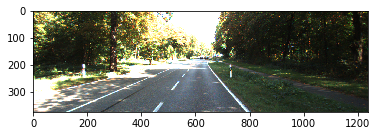

0 125 0 125


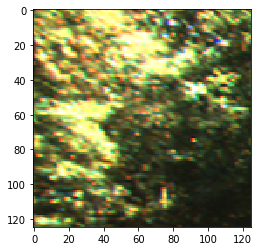

0 125 125 250


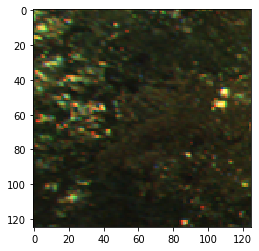

0 125 250 375


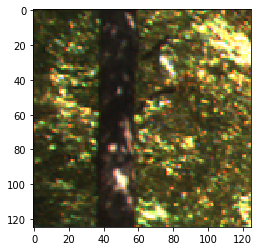

0 125 375 500


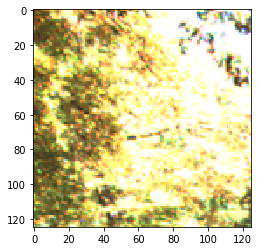

0 125 500 625


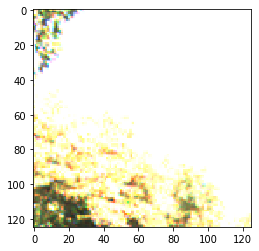

0 125 625 750


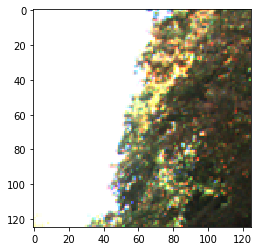

0 125 750 875


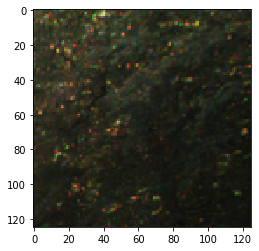

0 125 875 1000


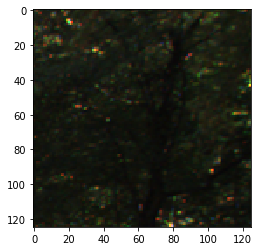

0 125 1000 1125


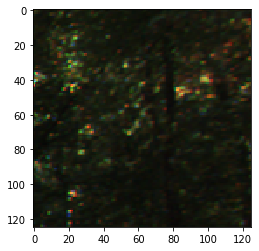

0 125 1113 1238


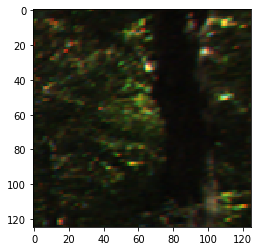

125 250 0 125


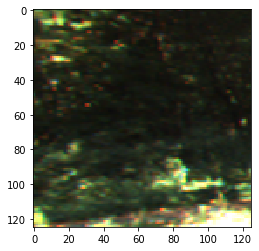

125 250 125 250


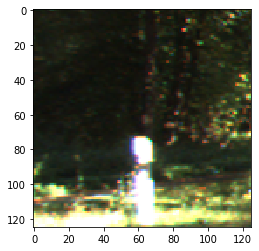

125 250 250 375


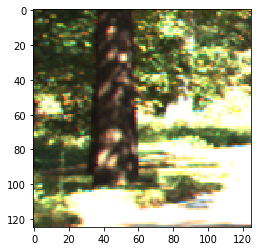

125 250 375 500


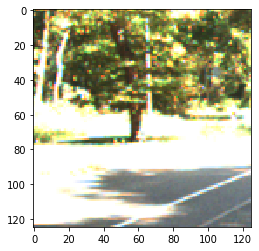

125 250 500 625


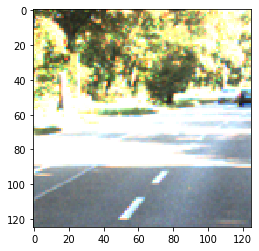

125 250 625 750


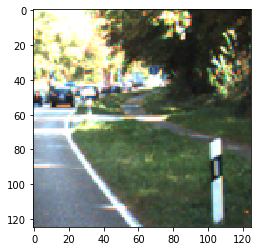

125 250 750 875


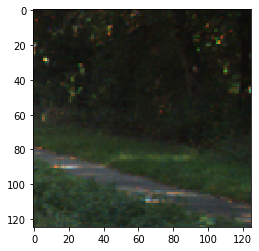

125 250 875 1000


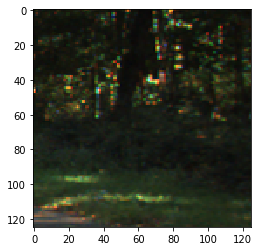

125 250 1000 1125


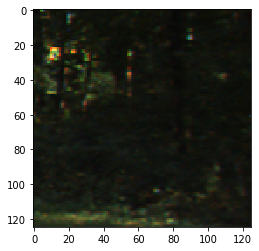

125 250 1113 1238


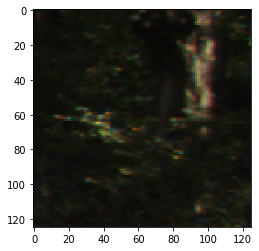

249 374 0 125


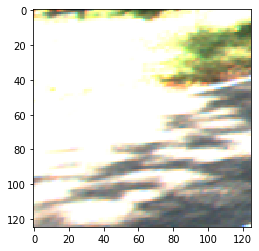

249 374 125 250


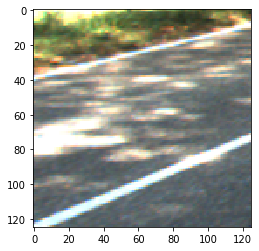

249 374 250 375


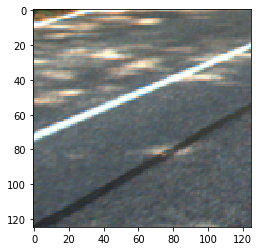

249 374 375 500


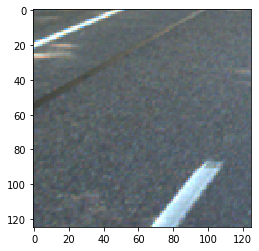

249 374 500 625


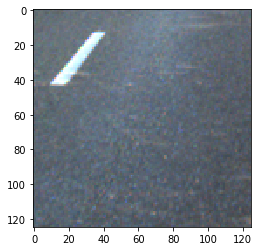

249 374 625 750


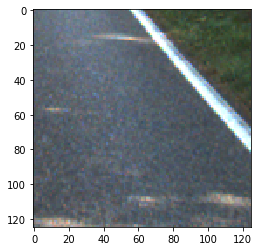

249 374 750 875


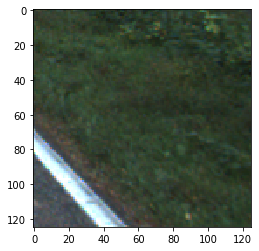

249 374 875 1000


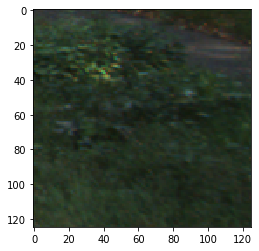

249 374 1000 1125


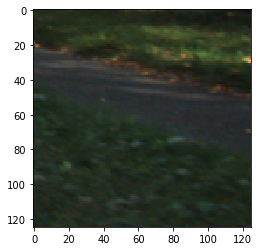

249 374 1113 1238


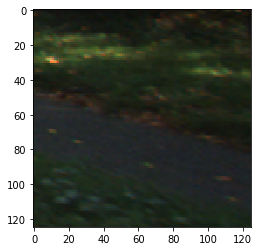

1it [00:04,  4.93s/it]

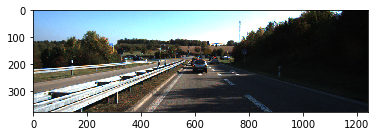

0 125 0 125


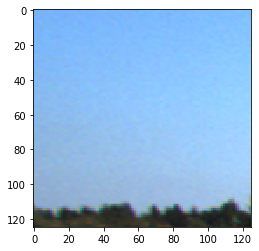

0 125 125 250


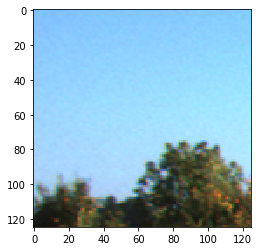

0 125 250 375


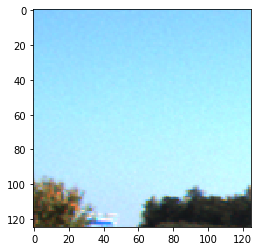

0 125 375 500


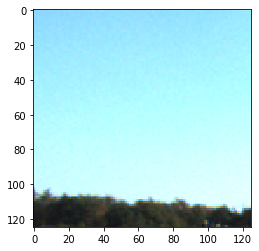

0 125 500 625


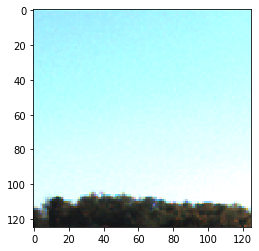

0 125 625 750


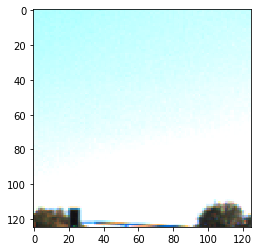

0 125 750 875


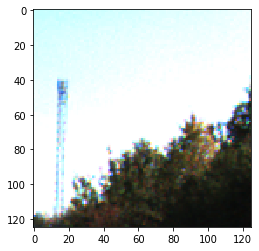

0 125 875 1000


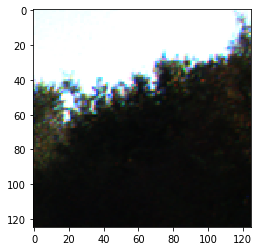

0 125 1000 1125


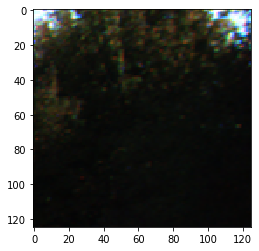

0 125 1116 1241


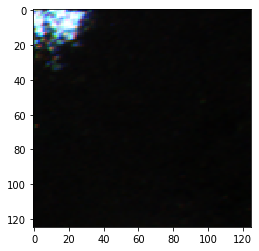

125 250 0 125


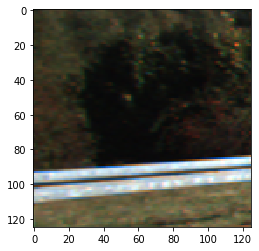

125 250 125 250


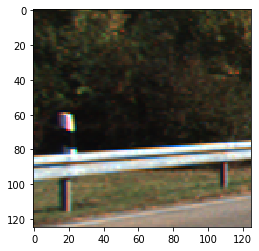

125 250 250 375


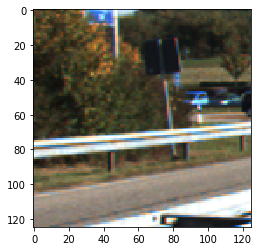

125 250 375 500


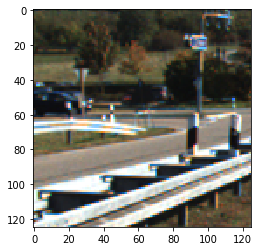

125 250 500 625


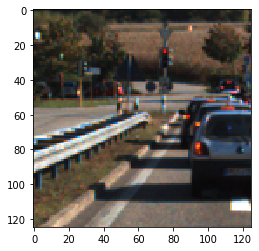

125 250 625 750


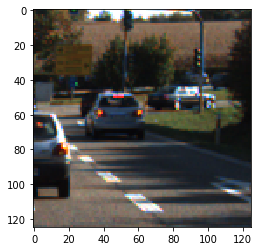

125 250 750 875


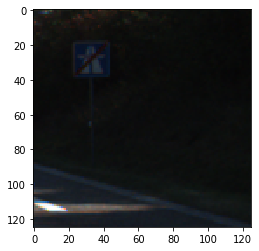

125 250 875 1000


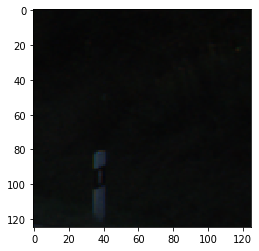

125 250 1000 1125


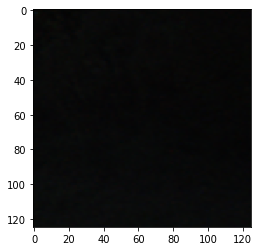

125 250 1116 1241


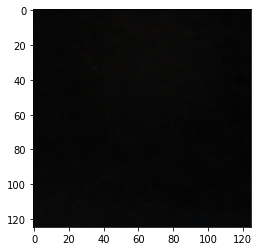

250 375 0 125


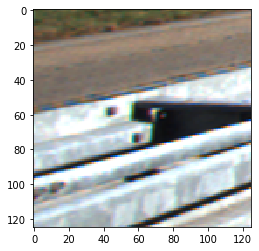

250 375 125 250


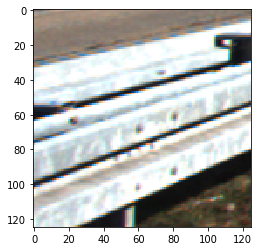

250 375 250 375


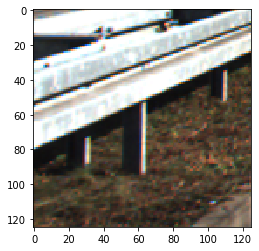

250 375 375 500


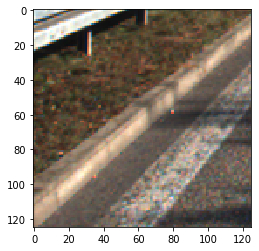

250 375 500 625


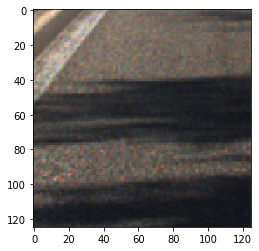

250 375 625 750


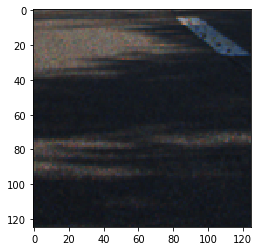

250 375 750 875


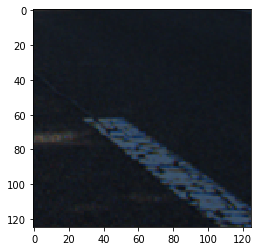

250 375 875 1000


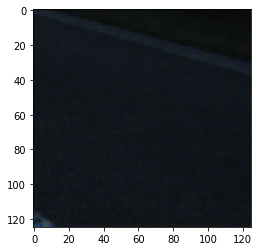

250 375 1000 1125


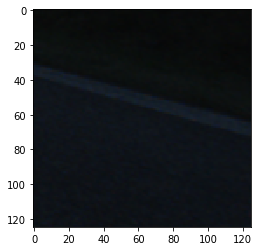

250 375 1116 1241


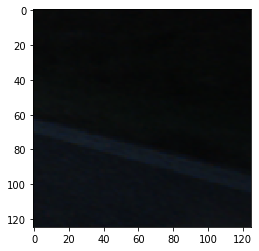

251 376 0 125


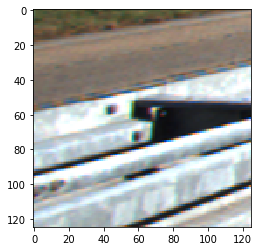

251 376 125 250


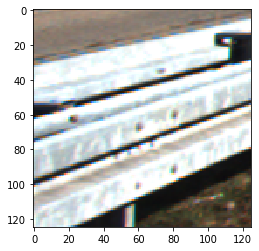

251 376 250 375


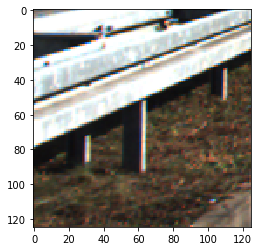

251 376 375 500


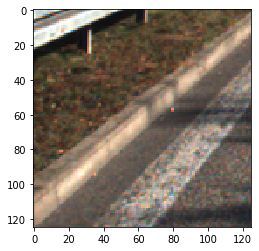

251 376 500 625


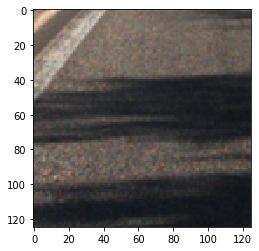

251 376 625 750


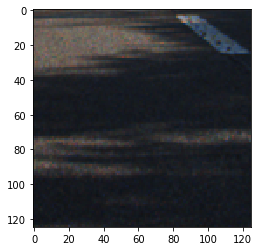

251 376 750 875


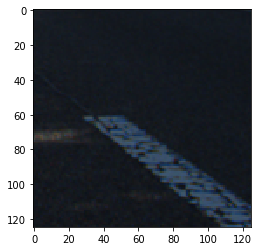

251 376 875 1000


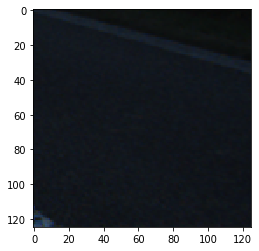

251 376 1000 1125


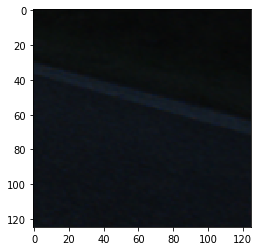

251 376 1116 1241


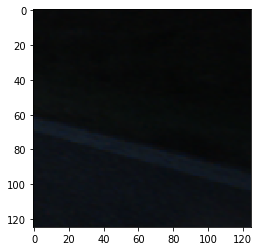

2it [00:11,  5.39s/it]

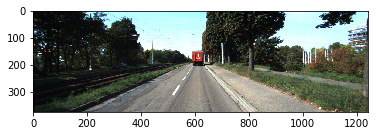

0 125 0 125


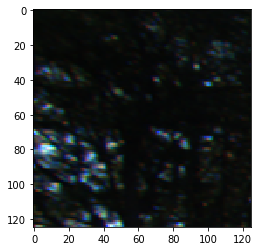

0 125 125 250


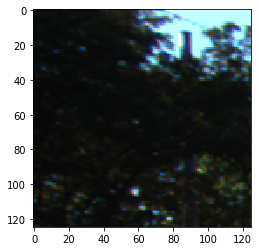

0 125 250 375


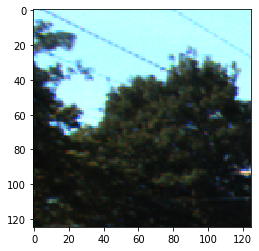

0 125 375 500


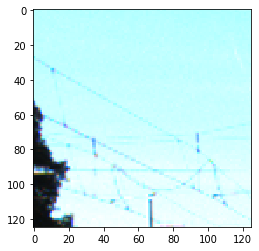

0 125 500 625


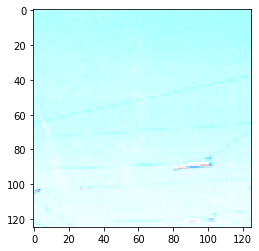

0 125 625 750


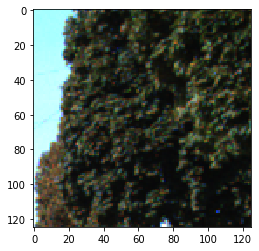

0 125 750 875


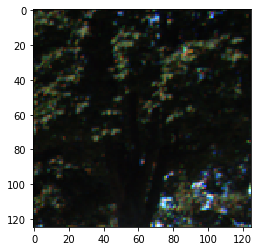

0 125 875 1000


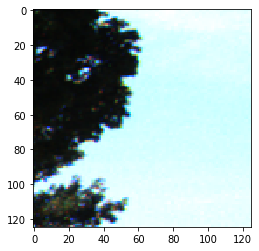

0 125 1000 1125


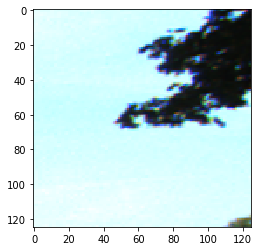

0 125 1117 1242


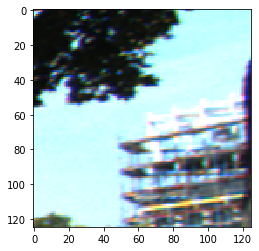

125 250 0 125


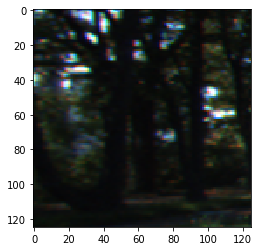

125 250 125 250


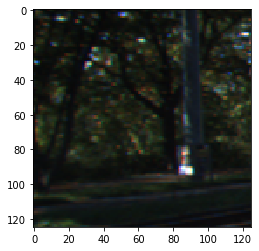

125 250 250 375


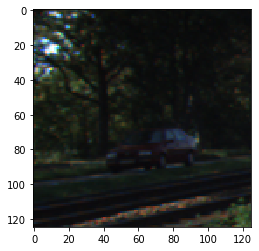

125 250 375 500


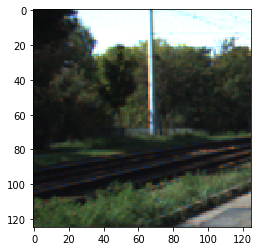

125 250 500 625


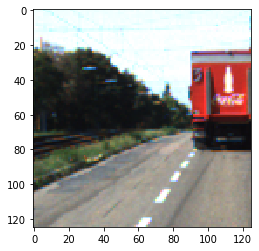

125 250 625 750


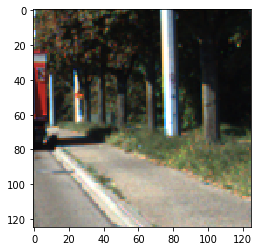

125 250 750 875


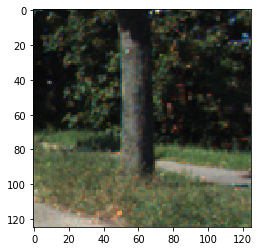

125 250 875 1000


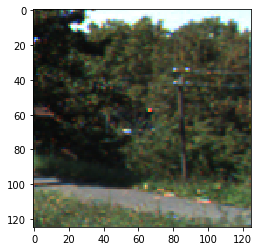

125 250 1000 1125


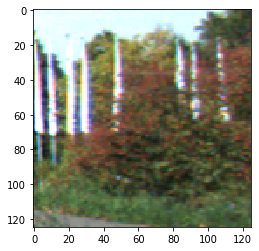

125 250 1117 1242


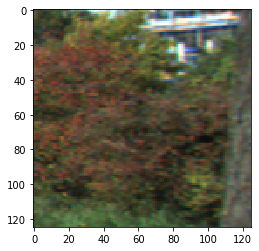

250 375 0 125


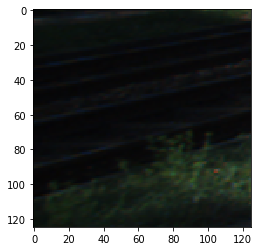

250 375 125 250


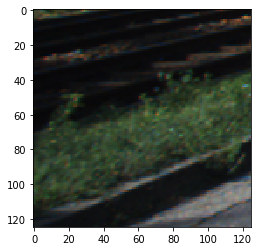

250 375 250 375


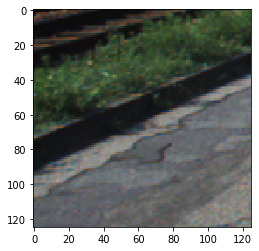

250 375 375 500


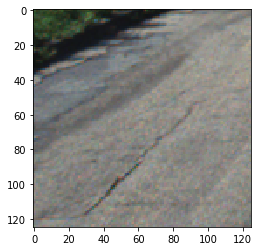

250 375 500 625


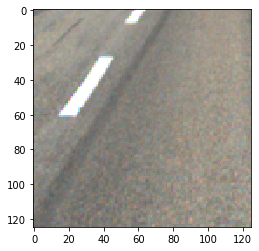

250 375 625 750


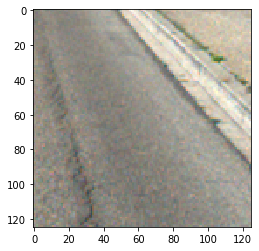

250 375 750 875


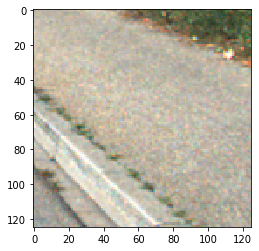

250 375 875 1000


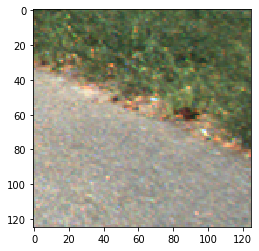

250 375 1000 1125


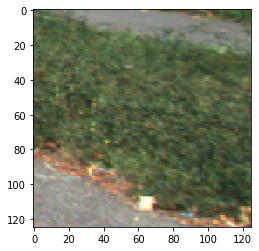

250 375 1117 1242


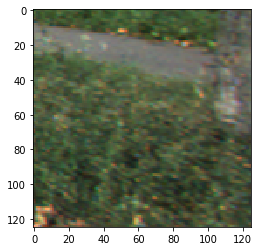

3it [00:16,  5.26s/it]

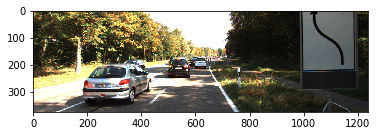

0 125 0 125


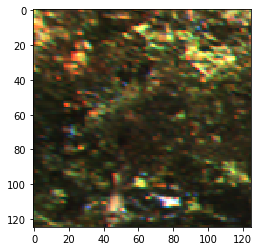

0 125 125 250


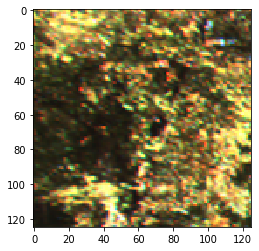

0 125 250 375


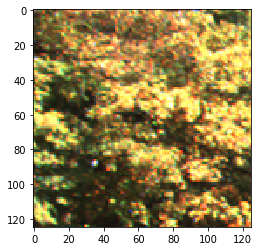

0 125 375 500


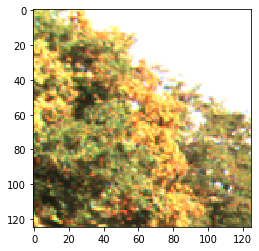

0 125 500 625


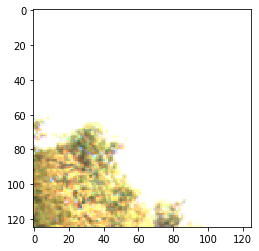

0 125 625 750


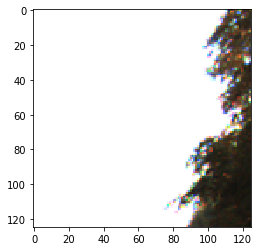

0 125 750 875


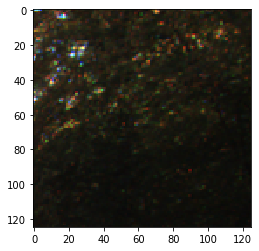

0 125 875 1000


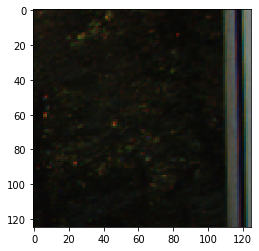

0 125 1000 1125


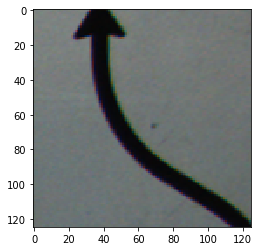

0 125 1113 1238


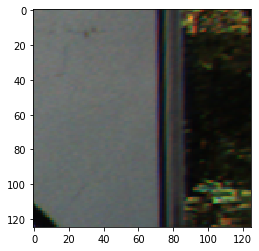

125 250 0 125


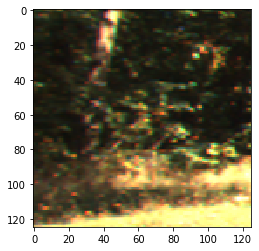

125 250 125 250


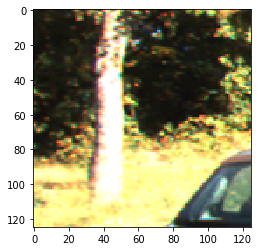

125 250 250 375


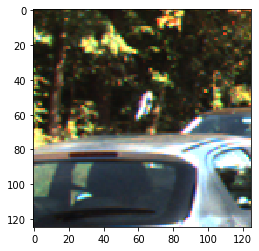

125 250 375 500


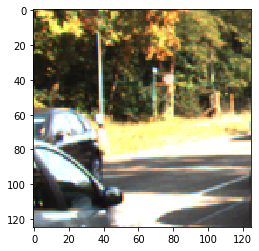

125 250 500 625


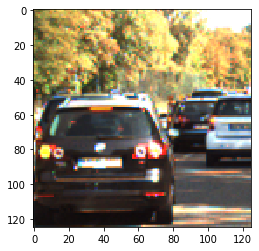

125 250 625 750


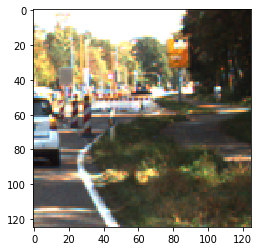

125 250 750 875


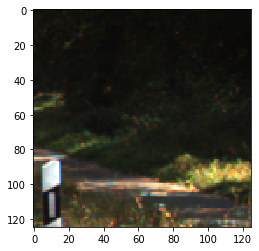

125 250 875 1000


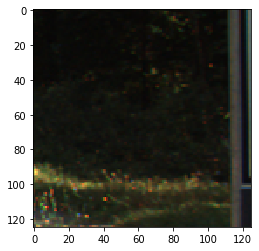

125 250 1000 1125


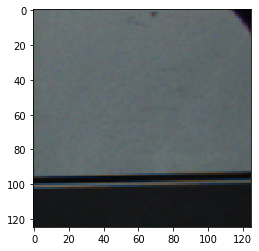

125 250 1113 1238


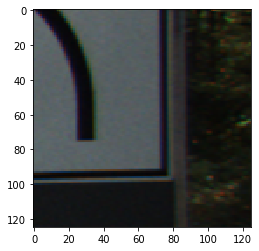

249 374 0 125


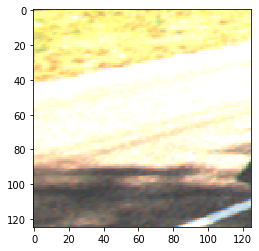

249 374 125 250


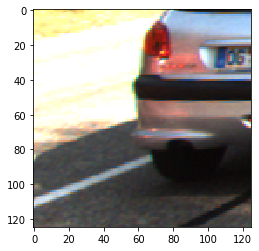

249 374 250 375


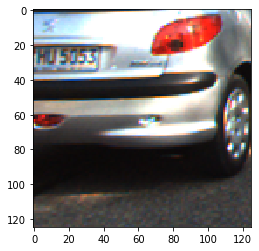

249 374 375 500


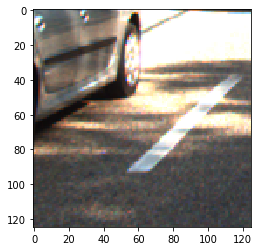

249 374 500 625


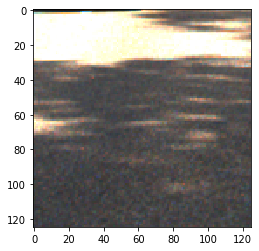

249 374 625 750


In [ ]:
# Crop into NxN tile (dump to disk or not?)

# Set stride dynamically for the tiles close to the boundary
# Return generator of image tiles
def crop_to_non_overlap_tile(img, N):
    idx_l, idx_t = 0, 0
    while 0 <= idx_t < img.shape[0]:
        if idx_t + N > img.shape[0]:
            idx_t = img.shape[0]-N

        while 0 <= idx_l < img.shape[1]:
            if idx_l + N > img.shape[1]:
                idx_l = img.shape[1]-N

            tile = img[idx_t:idx_t+N, idx_l:idx_l+N]
            print(idx_t, idx_t+N, idx_l, idx_l+N)
            yield tile
            idx_l += N

        idx_l = 0
        idx_t += N

N = 125

for i, (index, row) in tqdm(enumerate(balanced_image_class_info.iterrows())):

    # Read image from file
    img = cv2.imread(row["image_path"]) # Default BGR encoding
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    plt.imshow(img)
    plt.show()
    
    
    for tile in crop_to_non_overlap_tile(img, N):
        # TODO: Do something with the cropped tiles...
        plt.imshow(tile)
        plt.show()
    

    if i == 5:
        break
